# Color Quantization

This notebook explores potential to optimize storage further by color quantizing the jpg images

In [1]:
# Add the parent directory to the path
import sys  
sys.path.insert(1, '../')

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from io import BytesIO
from PIL import Image
from dotenv import load_dotenv

from lse.chunks.chunkers import LandscapeChunker

In [3]:
load_dotenv()

True

## Load sample tile images

In [4]:
root = os.getenv("DATA_ROOT")

In [5]:
# California block 1 data
ca_data_01 = f'{root}/archive/CA/california_R01C01'
ca_data_01_tif = f'{ca_data_01}/california_R01C01.tif'

Get the chunks

In [6]:
chunker = LandscapeChunker(ca_data_01_tif, 'R01C01', 'california', 256)

In [15]:
metas = chunker.meta()

Load the chunks

In [10]:
def range_metas(metas, st: int, end: int):
    for i, meta in enumerate(metas):
        if i < st:
            continue
        if i > end:
            break
        yield meta

In [12]:
start = 180
num_samples = 10

In [16]:
chunks = chunker.chunk(range_metas(metas, start, start + num_samples))

In [18]:
with chunker as c:
    samples = [next(chunks).chunk for _ in range(num_samples)]

Visualize pixel distribution

In [25]:
dist = np.zeros((256, 256), dtype=np.float32)

for sample in samples:
    dist += sample / 255

dist /= len(samples)

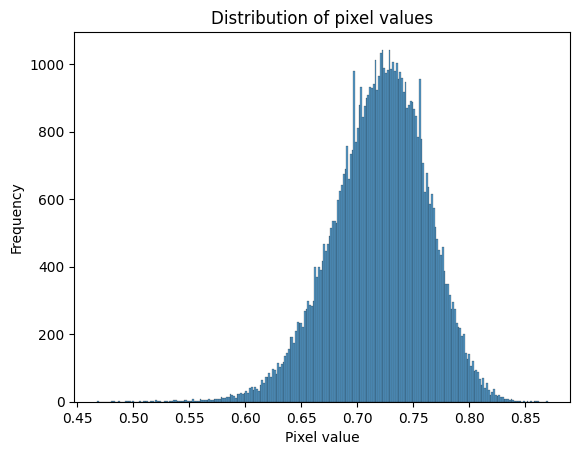

In [31]:
ax = sns.histplot(x=dist.flatten(), bins=255)
ax.set_title('Distribution of pixel values')
ax.set_xlabel('Pixel value')
ax.set_ylabel('Frequency')
plt.show()

Visualize samples

In [32]:
def display_samples(samples):
    _, axs = plt.subplots(2, 5, figsize=(20, 10))

    for i, sample in enumerate(samples):
        ax = axs[i // 5, i % 5]
        ax.imshow(sample, cmap='gray')
        ax.axis('off')

    plt.tight_layout()
    plt.show()

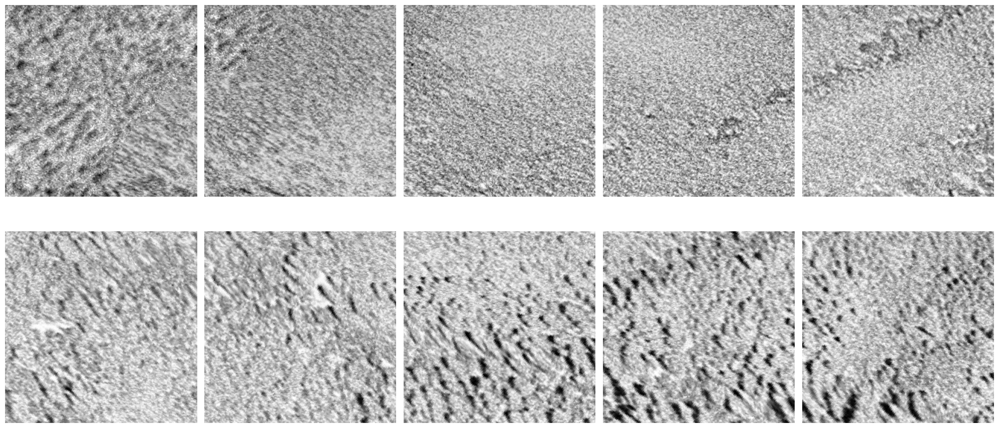

In [33]:
display_samples(samples)

## Color Quantize

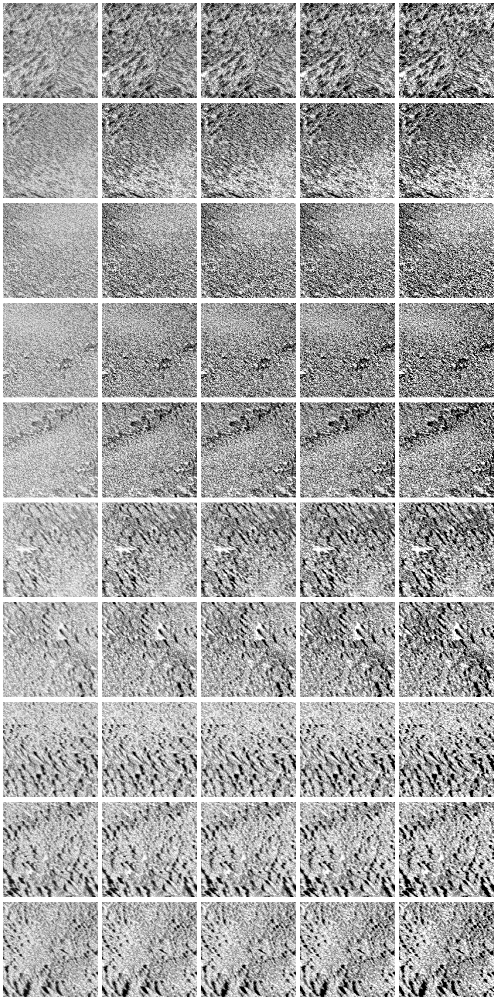

In [97]:
_, axs = plt.subplots(10, 5, figsize=(15, 30))

for i, sample in enumerate(samples):
    ax = axs[i, 0]
    ax.imshow(sample, cmap='gray')
    ax.axis('off')

    for j, colors in enumerate([64, 32, 16, 8]):
        img = Image.fromarray(sample, mode='L').quantize(colors).convert('L')
        ax = axs[i, j+1]
        ax.imshow(img, cmap='gray')
        ax.axis('off')

plt.tight_layout()
plt.show()

In [64]:
q_colors = 4

q_samples = [Image.fromarray(sample, mode='L').quantize(q_colors).convert('L')
             for sample in samples]

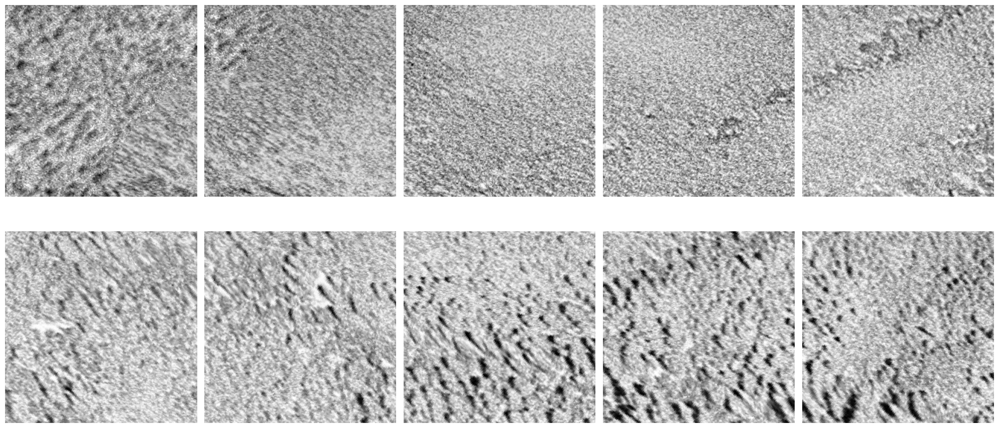

In [67]:
display_samples(samples)

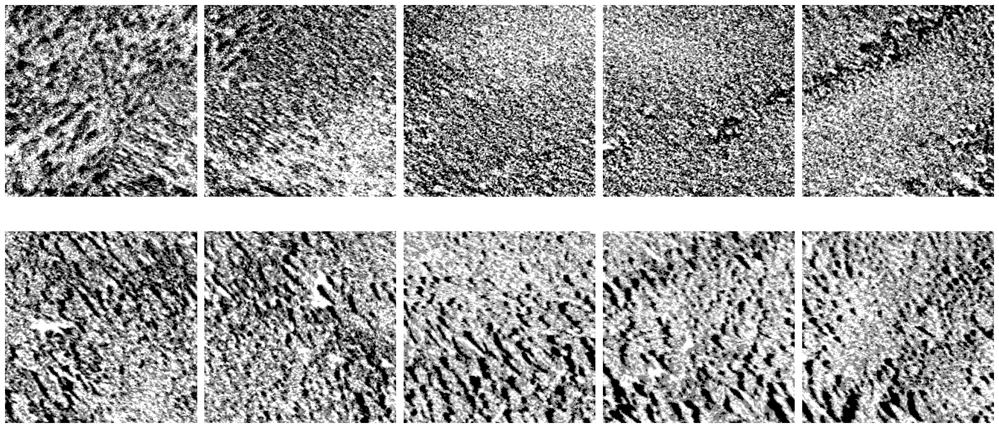

In [66]:
display_samples(q_samples)

## Storage Estimation

In [77]:
def get_size_in_bytes(img, mode='jpeg'):
    b = BytesIO()
    img.save(b, format=mode)
    b.seek(0)
    return len(b.read())

### JPG

In [82]:
sizes = np.array([get_size_in_bytes(Image.fromarray(sample, mode='L')) for sample in samples])
q_sizes = np.array([get_size_in_bytes(sample) for sample in q_samples])

print(f'Original sizes: {sizes}')
print(f'Quantized sizes: {q_sizes}')

Original sizes: [20167 17610 16755 17294 18649 19305 19820 20502 21009 21264]
Quantized sizes: [19396 17144 16011 16683 17993 19419 19989 20915 21768 21717]


Visualize size distribution

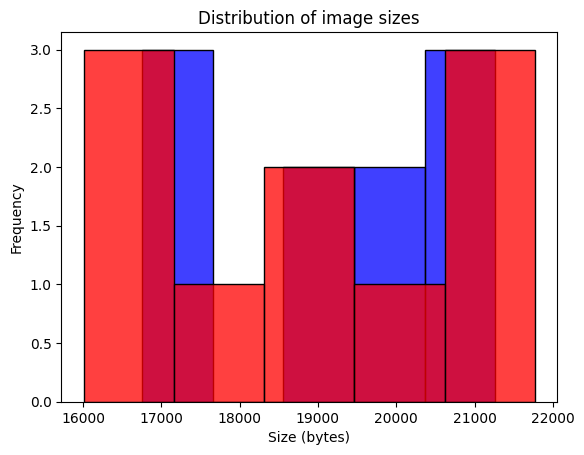

In [72]:
ax = sns.histplot(sizes, color='blue', label='Original')
ax = sns.histplot(q_sizes, color='red', label='Quantized', ax=ax)
ax.set_title('Distribution of image sizes')
ax.set_xlabel('Size (bytes)')
ax.set_ylabel('Frequency')
plt.show()

Compression rate

In [73]:
compression_ratio = np.mean(sizes / q_sizes)
print(f'Compression ratio: {compression_ratio}')

Compression ratio: 1.0096684056654783


Scale estimation of sizes

In [74]:
total_expected_samples = 400_000

In [83]:
expected_size = total_expected_samples * np.mean(sizes)
expected_q_size = total_expected_samples * np.mean(q_sizes)

print(f'Expected original size: {expected_size}')
print(f'Expected quantized size: {expected_q_size}')

Expected original size: 7695000000.0
Expected quantized size: 7641400000.0


### PNG

In [93]:
sizes = np.array([get_size_in_bytes(Image.fromarray(sample, mode='L'), 'png') for sample in samples])
q_sizes = np.array([get_size_in_bytes(sample, 'png') for sample in q_samples])

print(f'Original sizes: {sizes}')
print(f'Quantized sizes: {q_sizes}')

Original sizes: [49141 46958 46651 46989 48352 49162 50609 50971 50830 50833]
Quantized sizes: [20688 19988 22020 21970 21196 19098 20262 18449 17820 18585]


In [94]:
compression_ratio = np.mean(sizes / q_sizes)
print(f'Compression ratio: {compression_ratio}')

Compression ratio: 2.46854946019804


In [95]:
expected_size = total_expected_samples * np.mean(sizes)
expected_q_size = total_expected_samples * np.mean(q_sizes)

print(f'Expected original size: {expected_size}')
print(f'Expected quantized size: {expected_q_size}')

Expected original size: 19619840000.0
Expected quantized size: 8003039999.999999


### WEBP

In [90]:
sizes = np.array([get_size_in_bytes(Image.fromarray(sample, mode='L'), 'webp') for sample in samples])
q_sizes = np.array([get_size_in_bytes(sample, 'webp') for sample in q_samples])

print(f'Original sizes: {sizes}')
print(f'Quantized sizes: {q_sizes}')

Original sizes: [22642 20284 19774 20214 21440 21690 22056 22910 23192 23466]
Quantized sizes: [21776 19682 19006 19844 20964 21172 21836 22504 23100 23250]


In [91]:
compression_ratio = np.mean(sizes / q_sizes)
print(f'Compression ratio: {compression_ratio}')

Compression ratio: 1.021796981732701


In [92]:
expected_size = total_expected_samples * np.mean(sizes)
expected_q_size = total_expected_samples * np.mean(q_sizes)

print(f'Expected original size: {expected_size}')
print(f'Expected quantized size: {expected_q_size}')

Expected original size: 8706720000.0
Expected quantized size: 8525360000.000001


## Conclusion

While quantizing can drastically reduce the pixel space without loosing too much noticeable detail, the quantization and efficiencies of JPG mean that there is no added benefit to prior color quantization